In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from google.colab import files


In [ ]:
def analyze_image(img_rgb, image_name="", n_colors=5):
    """
    Verilen RGB görüntüyü bileşenlerine ayırır ve analiz eder:
    - Orijinal
    - RGB kanalları
    - HSV kanalları
    - Kenar tespiti (Canny)
    - Baskın renkler (KMeans)
    - Segmentasyon (KMeans sonuçları ile)
    """
    print(f"\n===== Analiz edilen görsel: {image_name} =====")

    # --- RGB Kanalları ---
    R, G, B = cv2.split(img_rgb)

    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    fig.suptitle(f"RGB Kanalları - {image_name}", fontsize=14)

    axs[0].imshow(img_rgb)
    axs[0].set_title("Orijinal")
    axs[0].axis("off")

    axs[1].imshow(R, cmap="gray")
    axs[1].set_title("R Kanalı")
    axs[1].axis("off")

    axs[2].imshow(G, cmap="gray")
    axs[2].set_title("G Kanalı")
    axs[2].axis("off")

    axs[3].imshow(B, cmap="gray")
    axs[3].set_title("B Kanalı")
    axs[3].axis("off")

    plt.tight_layout()
    plt.show()

    # --- HSV Kanalları ---
    img_hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
    H, S, V = cv2.split(img_hsv)

    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    fig.suptitle(f"HSV Kanalları - {image_name}", fontsize=14)

    axs[0].imshow(img_rgb)
    axs[0].set_title("Orijinal (RGB)")
    axs[0].axis("off")

    axs[1].imshow(H, cmap="gray")
    axs[1].set_title("Hue (Renk)")
    axs[1].axis("off")

    axs[2].imshow(S, cmap="gray")
    axs[2].set_title("Saturation (Doygunluk)")
    axs[2].axis("off")

    axs[3].imshow(V, cmap="gray")
    axs[3].set_title("Value (Parlaklık)")
    axs[3].axis("off")

    plt.tight_layout()
    plt.show()

    # --- Canny Kenar Tespiti ---
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, threshold1=100, threshold2=200)

    plt.figure(figsize=(6, 6))
    plt.imshow(edges, cmap="gray")
    plt.axis("off")
    plt.title(f"Canny Kenar Tespiti - {image_name}")
    plt.show()

    # --- Baskın Renkler (KMeans) ---
    pixels = img_rgb.reshape(-1, 3)

    kmeans = KMeans(n_clusters=n_colors, random_state=42)
    kmeans.fit(pixels)

    colors = kmeans.cluster_centers_.astype(int)
    labels = kmeans.labels_

    print("Baskın renkler (RGB):")
    for i, c in enumerate(colors):
        print(f"{i+1}. renk:", c)

    plt.figure(figsize=(8, 2))
    for i, c in enumerate(colors):
        plt.subplot(1, n_colors, i+1)
        plt.imshow(np.ones((50, 50, 3), dtype=np.uint8) * c)
        plt.axis("off")
        plt.title(f"Renk {i+1}")
    plt.tight_layout()
    plt.show()

    # --- Segmentasyon ---
    segmented_pixels = colors[labels]
    segmented_img = segmented_pixels.reshape(img_rgb.shape)

    plt.figure(figsize=(6, 6))
    plt.imshow(segmented_img)
    plt.axis("off")
    plt.title(f"KMeans Segmentasyon (n_colors={n_colors}) - {image_name}")
    plt.show()


In [ ]:
# Birden fazla görsel yükle (6 tane de olur, daha fazla da)
uploaded = files.upload()

print("Yüklenen dosyalar:")
for name in uploaded.keys():
    print("-", name)


Saving ppbJUaa-xSY0sE2lEIY5__6fe8d2510ab340999f6f14f3e9fa55c3.png to ppbJUaa-xSY0sE2lEIY5__6fe8d2510ab340999f6f14f3e9fa55c3.png
Saving AcF9c7EfMvp5D7G3Uq2jK_5062a3696bfb41eb8b2b3477b62d21a0.png to AcF9c7EfMvp5D7G3Uq2jK_5062a3696bfb41eb8b2b3477b62d21a0.png
Saving 0NsU4NATi43tfDONc5P4O.png to 0NsU4NATi43tfDONc5P4O.png
Saving SBhvyNUq0Neyf76y8_ntI.png to SBhvyNUq0Neyf76y8_ntI.png
Saving x50IqrIIOE9lJ2HT9SloU.jpg to x50IqrIIOE9lJ2HT9SloU.jpg
Saving mekDInS6g5bDVcCL1mVbG.png to mekDInS6g5bDVcCL1mVbG.png
Yüklenen dosyalar:
- ppbJUaa-xSY0sE2lEIY5__6fe8d2510ab340999f6f14f3e9fa55c3.png
- AcF9c7EfMvp5D7G3Uq2jK_5062a3696bfb41eb8b2b3477b62d21a0.png
- 0NsU4NATi43tfDONc5P4O.png
- SBhvyNUq0Neyf76y8_ntI.png
- x50IqrIIOE9lJ2HT9SloU.jpg
- mekDInS6g5bDVcCL1mVbG.png


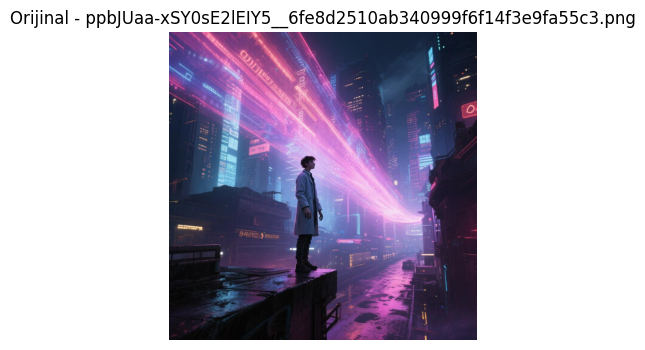


===== Analiz edilen görsel: ppbJUaa-xSY0sE2lEIY5__6fe8d2510ab340999f6f14f3e9fa55c3.png =====


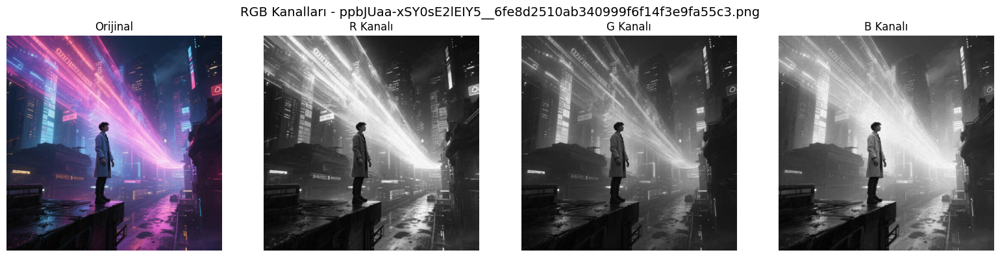

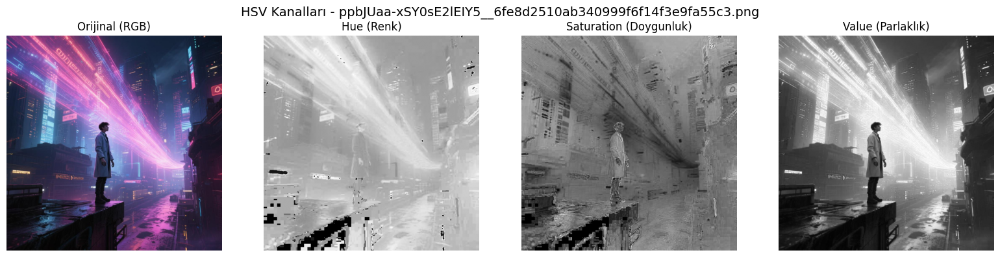

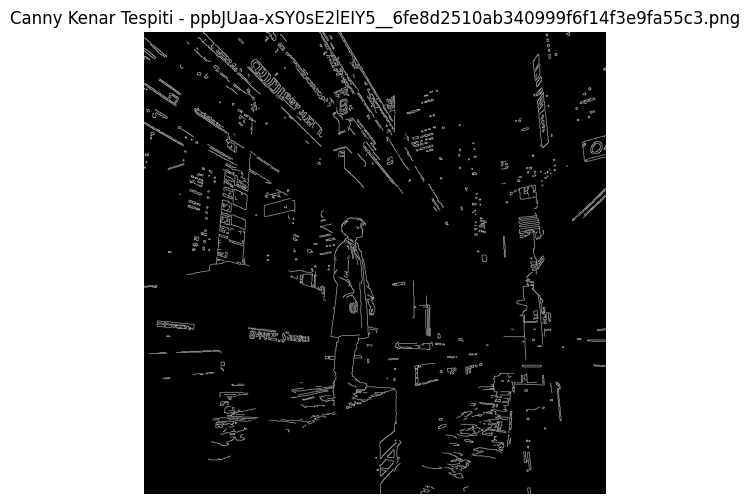

Baskın renkler (RGB):
1. renk: [216 159 218]
2. renk: [46 46 78]
3. renk: [ 95  75 132]
4. renk: [22 20 32]
5. renk: [149 115 184]


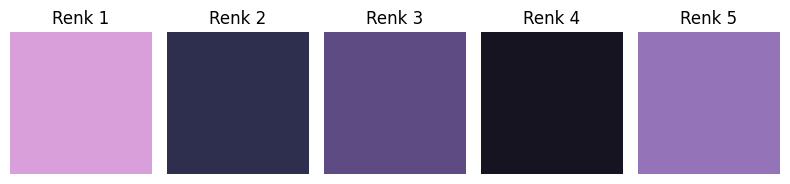

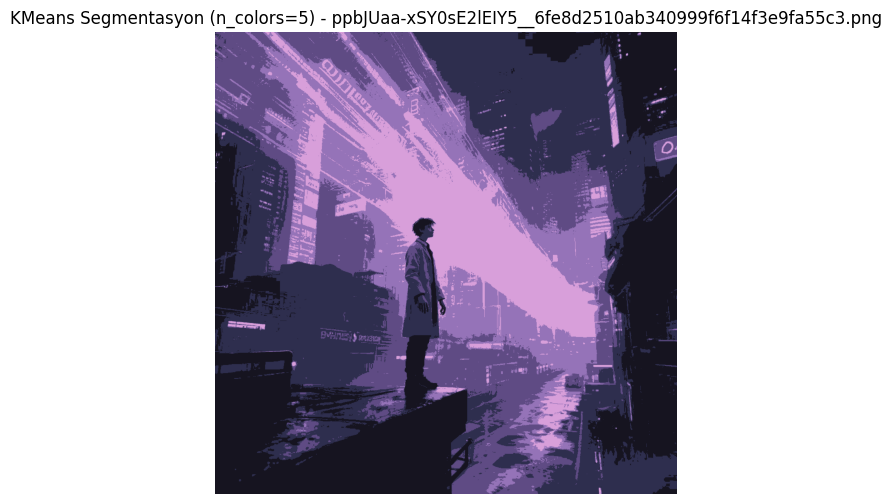

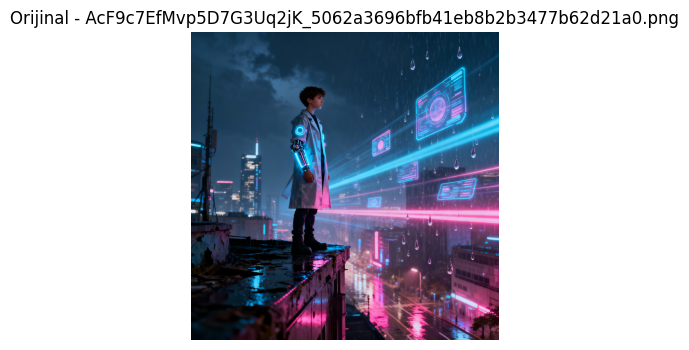


===== Analiz edilen görsel: AcF9c7EfMvp5D7G3Uq2jK_5062a3696bfb41eb8b2b3477b62d21a0.png =====


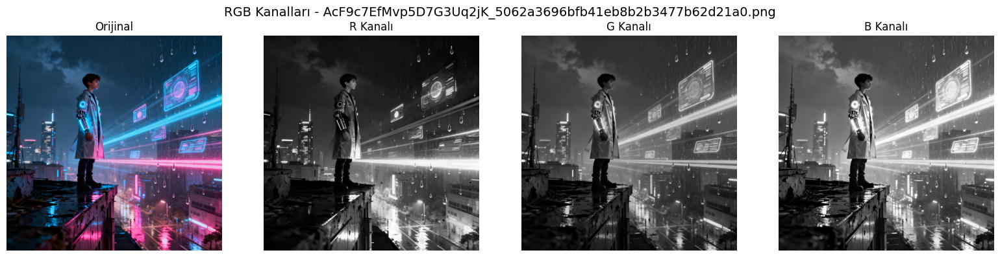

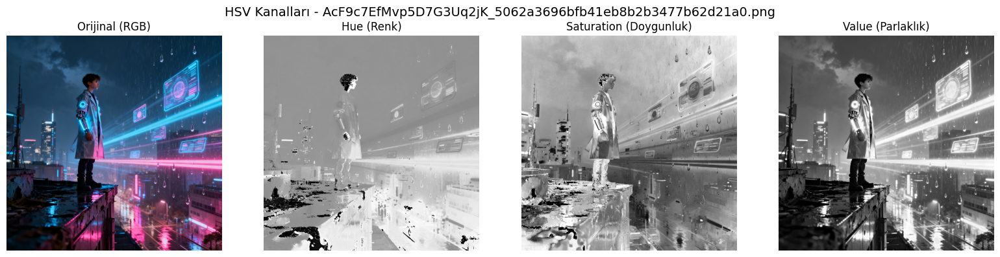

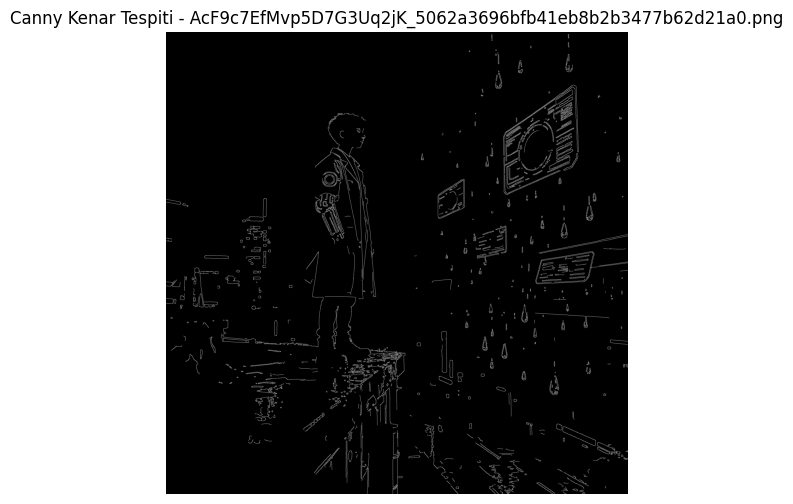

Baskın renkler (RGB):
1. renk: [18 14 22]
2. renk: [118  66 104]
3. renk: [34 60 88]
4. renk: [ 76 138 191]
5. renk: [211 141 195]


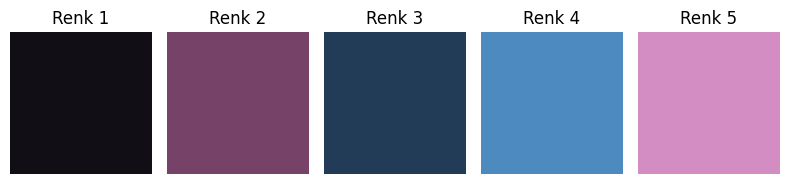

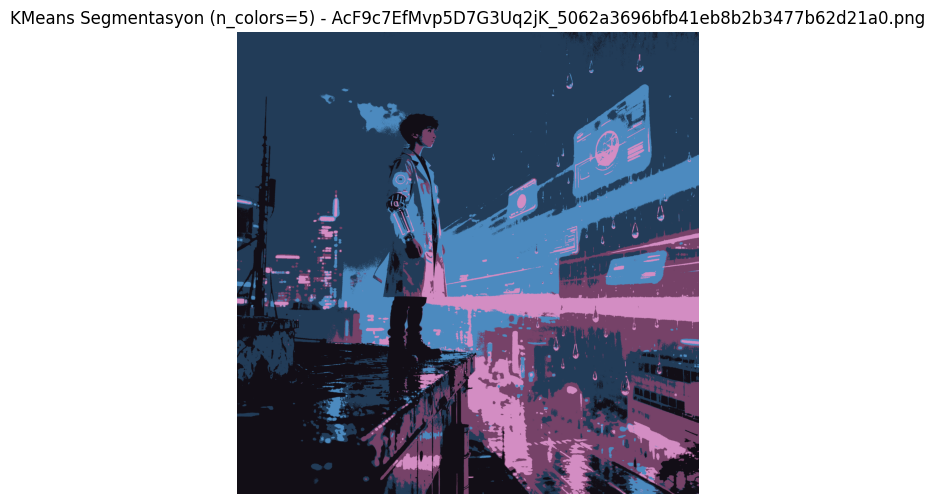

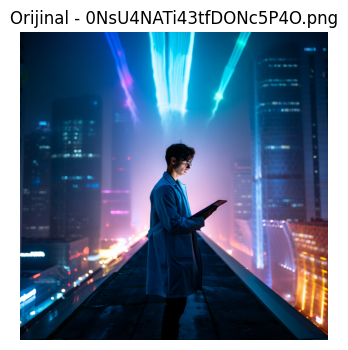


===== Analiz edilen görsel: 0NsU4NATi43tfDONc5P4O.png =====


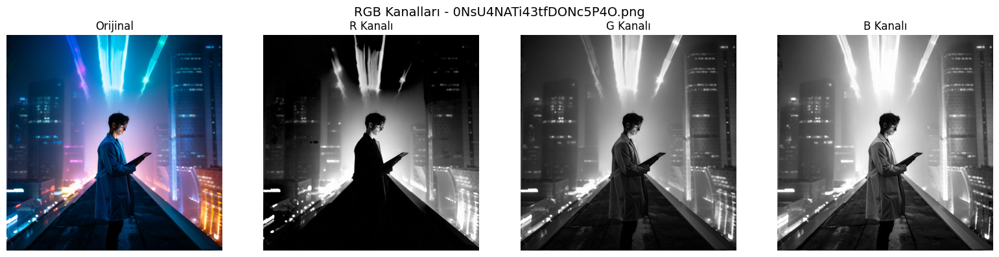

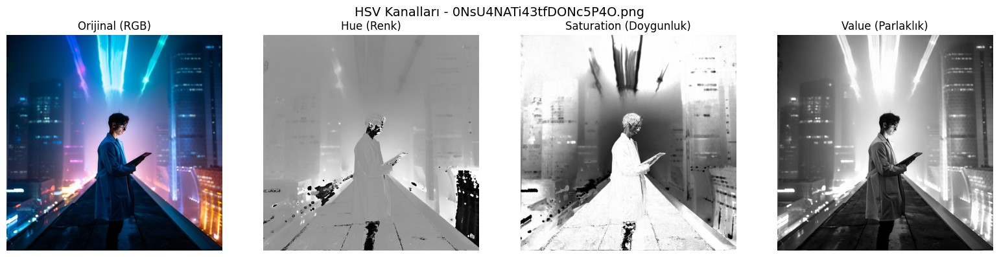

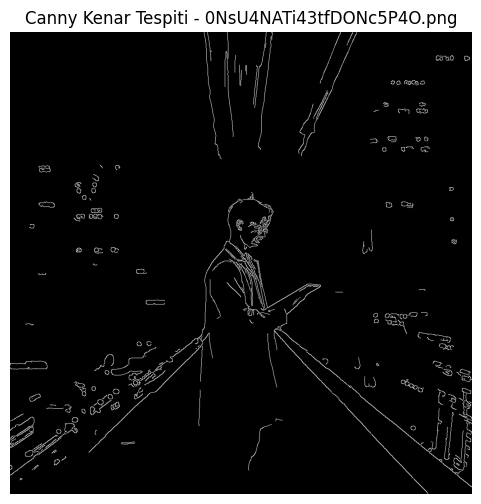

Baskın renkler (RGB):
1. renk: [ 4 23 43]
2. renk: [145 111 135]
3. renk: [ 24  64 104]
4. renk: [189 189 226]
5. renk: [ 36 134 196]


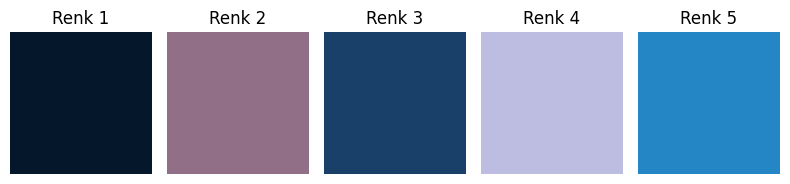

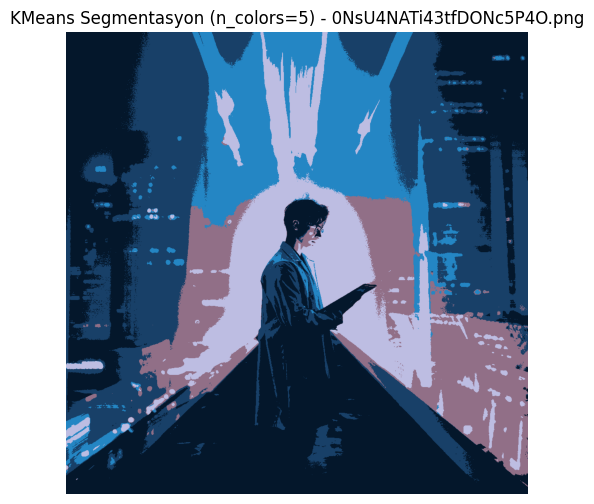

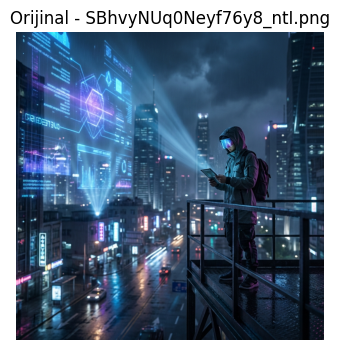


===== Analiz edilen görsel: SBhvyNUq0Neyf76y8_ntI.png =====


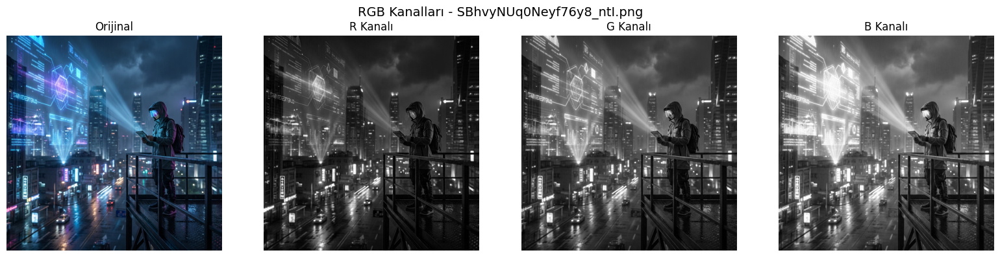

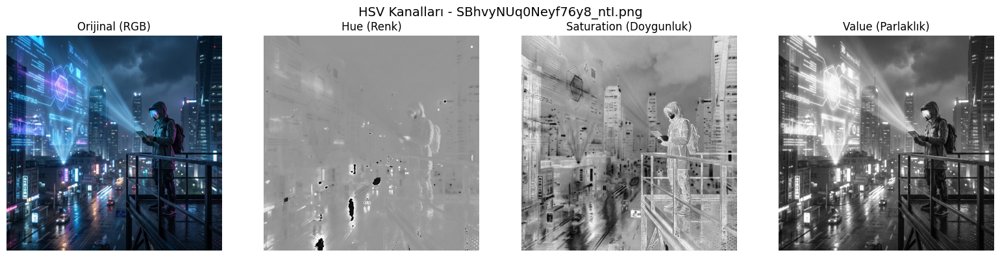

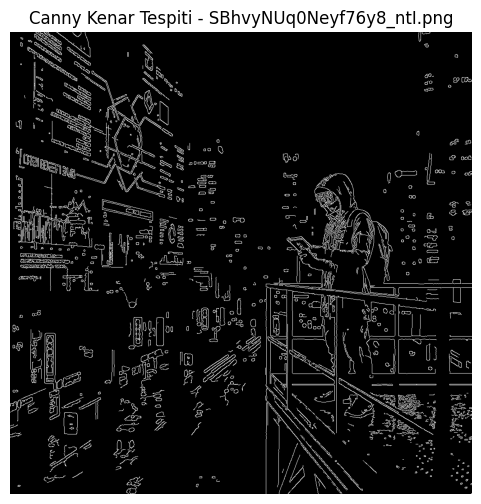

Baskın renkler (RGB):
1. renk: [165 199 233]
2. renk: [ 58  89 124]
3. renk: [33 55 80]
4. renk: [ 82 134 186]
5. renk: [11 22 35]


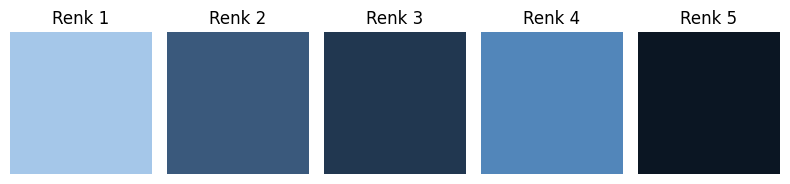

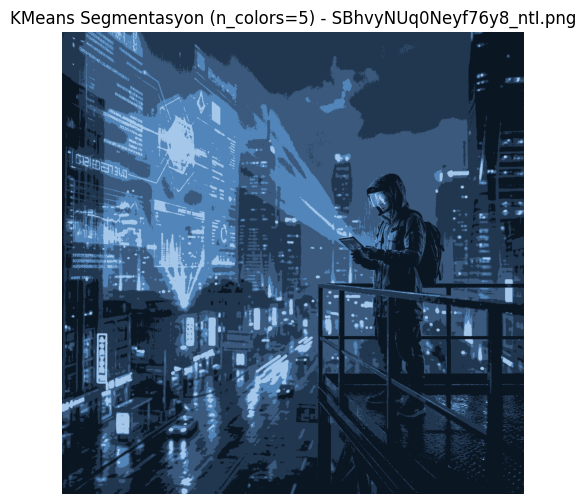

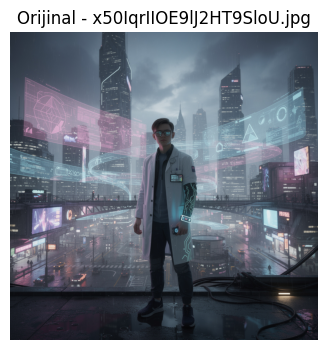


===== Analiz edilen görsel: x50IqrIIOE9lJ2HT9SloU.jpg =====


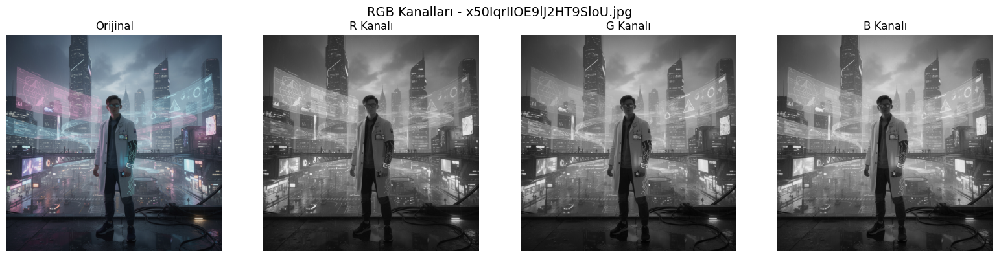

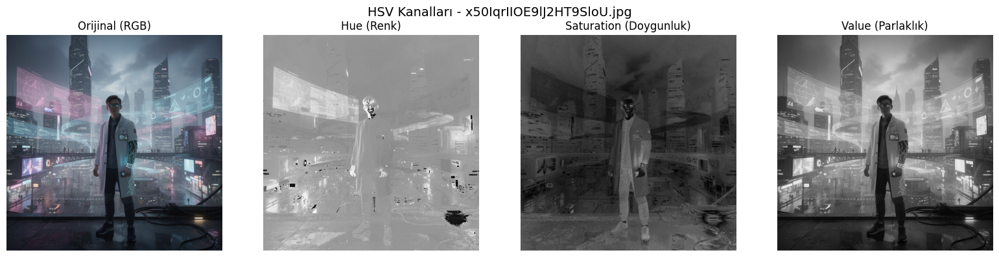

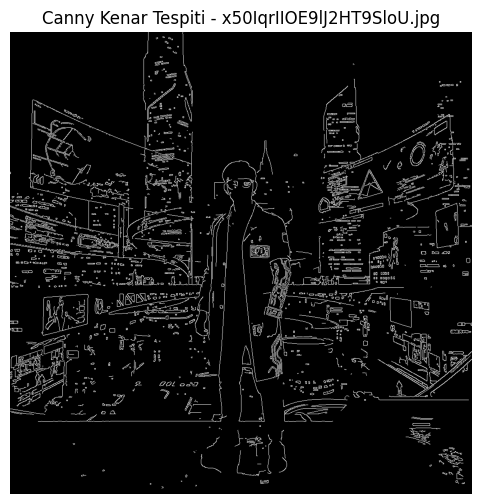

Baskın renkler (RGB):
1. renk: [26 29 37]
2. renk: [129 139 156]
3. renk: [62 70 82]
4. renk: [171 180 193]
5. renk: [ 93 102 118]


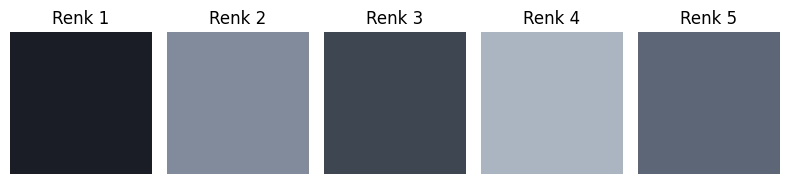

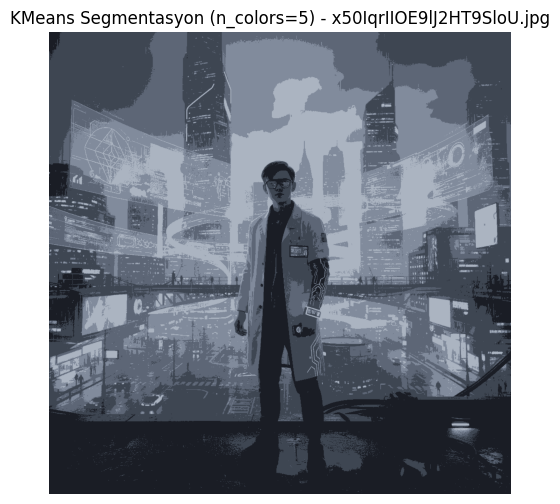

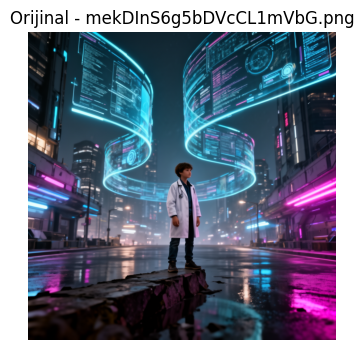


===== Analiz edilen görsel: mekDInS6g5bDVcCL1mVbG.png =====


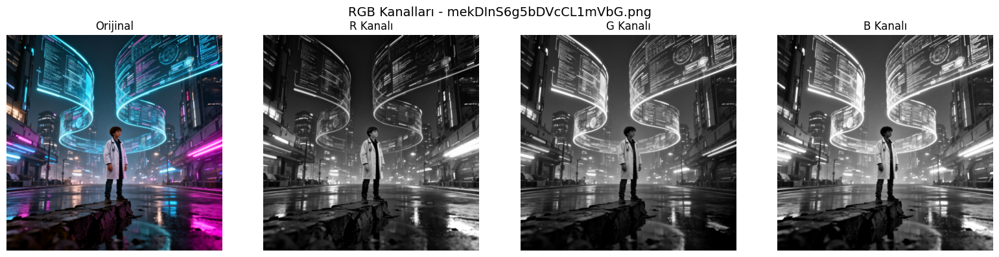

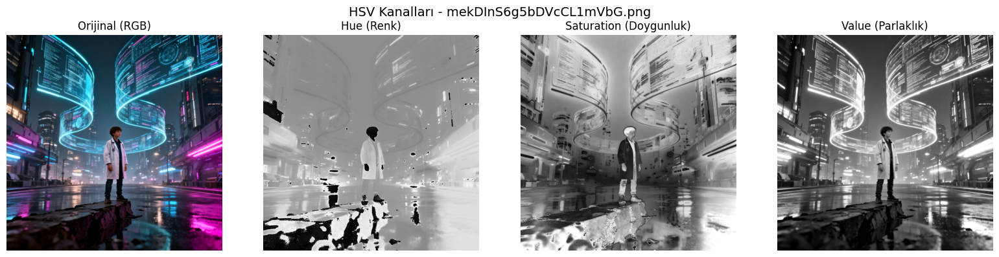

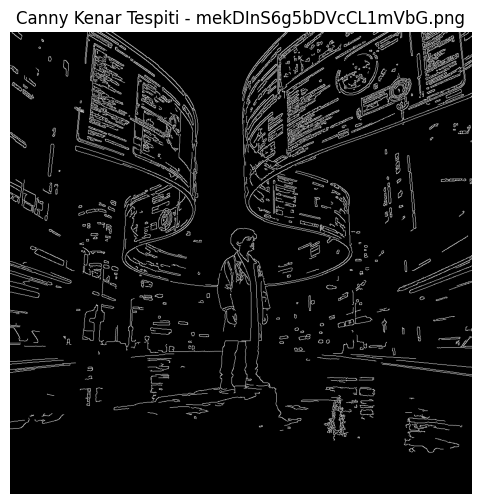

Baskın renkler (RGB):
1. renk: [146 187 213]
2. renk: [50 62 86]
3. renk: [19 23 32]
4. renk: [ 79 117 146]
5. renk: [176  36 155]


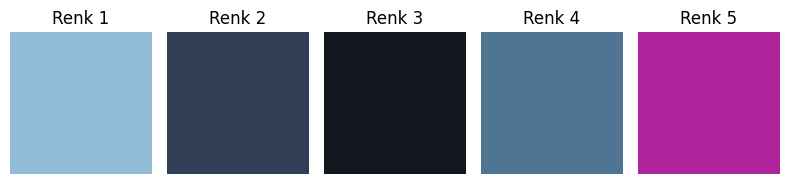

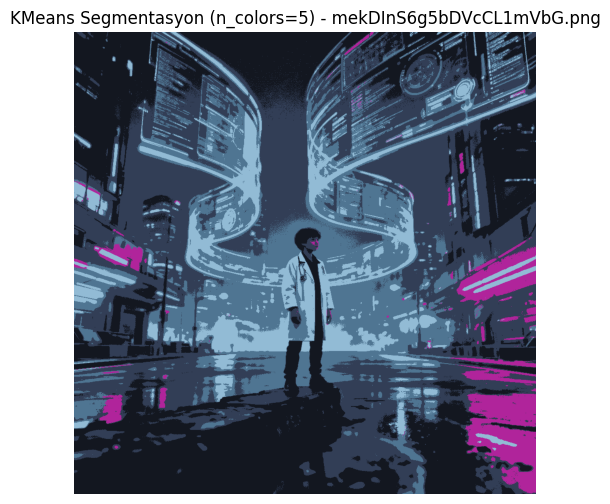

In [ ]:
for image_name, file_content in uploaded.items():
    # byte -> numpy array
    file_bytes = np.frombuffer(file_content, np.uint8)
    img_bgr = cv2.imdecode(file_bytes, cv2.IMREAD_COLOR)

    if img_bgr is None:
        print(f"Görsel okunamadı: {image_name}")
        continue

    # BGR -> RGB
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # Orijinal görüntüyü hızlıca göster
    plt.figure(figsize=(4, 4))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(f"Orijinal - {image_name}")
    plt.show()

    # Analiz fonksiyonunu çağır
    analyze_image(img_rgb, image_name=image_name, n_colors=5)
